# Face Similarity using Openface on the Totally Looks Like dataset that was cleaned and prepared specifically for facial similarity.

## Normally the dataset contains two folders (left and right; image a in left is similar to image a in right) but we decided to add another folder wich combine both folders and leave the similar images next to each other.


In [1]:
import pandas as pd
import scipy.io
import numpy as np


from datetime import datetime, timedelta
import time

import tensorflow as tf

from deepface import DeepFace
import keras 
from keras.preprocessing import image


from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.layers import Dense, Activation, Dropout, Flatten, Input, Convolution2D, ZeroPadding2D, MaxPooling2D, Activation
from keras.layers import Conv2D, AveragePooling2D
from keras.models import Model, Sequential
from keras import metrics
from keras.models import model_from_json
from keras.applications.imagenet_utils import preprocess_input
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt

import cv2

import pandas as pd

import numpy as np


In [2]:

#open-cv's face detection module
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [3]:
import os
from pathlib import Path
#Change directory to root
path = Path(os.getcwd())
root_dir = path.parent.absolute()
os.chdir(str(root_dir))

In [4]:
# The dataframe containing the OpenFace respresentations
mypath=str(root_dir)+'/pickle/OpenFace/'
Open=pd.read_pickle(mypath+ 'OpenFace.pkl')
Open

,Path,OpenFace
0,00003 (2).jpg,"[-0.045208946, 0.13000047, -0.10426636, 0.0435..."
1,00003.jpg,"[-0.06114857, 0.15467297, -0.07367211, 0.07110..."
2,00010 (2).jpg,"[-0.04418547, 0.14385638, -0.0916792, 0.064502..."
3,00010.jpg,"[-0.079529375, 0.1576959, -0.0844679, 0.068877..."
4,00016 (2).jpg,"[-0.07990728, 0.14781392, -0.06295625, 0.06878..."
...,...,...
1595,06005.jpg,"[-0.057115797, 0.15446442, -0.04608789, 0.0775..."
1596,07182 (2).jpg,"[-0.04057959, 0.17370239, -0.056557324, 0.0609..."
1597,07182.jpg,"[-0.06438335, 0.13554783, -0.059921023, 0.0654..."
1598,07183 (2).jpg,"[-0.057411365, 0.108439855, -0.06767905, 0.066..."


In [5]:
# The model is included in the deepface library
model = DeepFace.build_model("OpenFace")

In [6]:
#Preprocessing of images by extracting the faces and resizing them in a 96x96 format for OpenFace
def preprocess_image(image_path,p):
    img = cv2.imread(p+image_path)
    faces = face_cascade.detectMultiScale(img, 1.3, 5)
    for (x,y,w,h) in faces:
        img = img[int(y):int(y+h), int(x):int(x+w)]
        
    detected_face = cv2.resize(img, (96, 96))
    
    img = img_to_array(detected_face)
    img = np.expand_dims(img, axis=0)
    img =preprocess_input(img)
    return img

In [7]:
#Get all the images names in a list 
r="/data/combined"
mypath=str(root_dir)+r
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
onlyfiles

['00003 (2).jpg',
 '00003.jpg',
 '00010 (2).jpg',
 '00010.jpg',
 '00016 (2).jpg',
 '00016.jpg',
 '00018 (2).jpg',
 '00018.jpg',
 '00020 (2).jpg',
 '00020.jpg',
 '00022 (2).jpg',
 '00022.jpg',
 '00025 (2).jpg',
 '00025.jpg',
 '00030 (2).jpg',
 '00030.jpg',
 '00035 (2).jpg',
 '00035.jpg',
 '00042 (2).jpg',
 '00042.jpg',
 '00047 (2).jpg',
 '00047.jpg',
 '00051 (2).jpg',
 '00051.jpg',
 '00062 (2).jpg',
 '00062.jpg',
 '00066 (2).jpg',
 '00066.jpg',
 '00068 (2).jpg',
 '00068.jpg',
 '00070 (2).jpg',
 '00070.jpg',
 '00072 (2).jpg',
 '00072.jpg',
 '00074 (2).jpg',
 '00074.jpg',
 '00075 (2).jpg',
 '00075.jpg',
 '00076 (2).jpg',
 '00076.jpg',
 '00080 (2).jpg',
 '00080.jpg',
 '00083 (2).jpg',
 '00083.jpg',
 '00087 (2).jpg',
 '00087.jpg',
 '00088 (2).jpg',
 '00088.jpg',
 '00089 (2).jpg',
 '00089.jpg',
 '00099 (2).jpg',
 '00099.jpg',
 '00101 (2).jpg',
 '00101.jpg',
 '00103 (2).jpg',
 '00103.jpg',
 '00104 (2).jpg',
 '00104.jpg',
 '00105 (2).jpg',
 '00105.jpg',
 '00130 (2).jpg',
 '00130.jpg',
 '00138 

In [8]:
#Represent the faces in the OpenFace embedding
def OpenFeature(path):
    dir=root_dir
    
    try:
        representation = model.predict(preprocess_image(path,dir))[0,:]
    except:
        representation= None
    return representation
    

# Measures of Similarity

In [9]:
def findCosineSimilarity(source_representation, test_representation):
    a = np.matmul(np.transpose(source_representation), test_representation)
    b = np.sum(np.multiply(source_representation, source_representation))
    c = np.sum(np.multiply(test_representation, test_representation))
    return 1 - (a / (np.sqrt(b) * np.sqrt(c)))

In [10]:
def findEuclideanDistance(source_representation, test_representation):
    euclidean_distance = source_representation - test_representation
    euclidean_distance = np.sum(np.multiply(euclidean_distance, euclidean_distance))
    euclidean_distance = np.sqrt(euclidean_distance)
    return euclidean_distance

In [11]:

def SimilarityEuc(representation, img1_representation):
   
    euclidean_distance = findEuclideanDistance(img1_representation, representation)
    return euclidean_distance


In [12]:
def SimilarityCos(representation, img1_representation):
    
    cosine_similarity = findCosineSimilarity(img1_representation, representation)
   
    return cosine_similarity

## To save time we already did the calculations let's load the numpy files.

In [13]:
'''
%%time
cos=np.zeros((1600,1600))
euc=np.zeros((1600,1600))

for i in range(1600):
    img=model.predict(preprocess_image(onlyfiles[i],root_dir))[0,:]
    for j in range(1600):
        cos[i][j]=SimilarityCos(Open.OpenFace[j],img)
        euc[i][j]=SimilarityEuc(Open.OpenFace[j],img)
      
   ''' 

'\n%%time\ncos=np.zeros((1600,1600))\neuc=np.zeros((1600,1600))\n\nfor i in range(1600):\n    img=model.predict(preprocess_image(onlyfiles[i],root_dir))[0,:]\n    for j in range(1600):\n        cos[i][j]=SimilarityCos(Open.OpenFace[j],img)\n        euc[i][j]=SimilarityEuc(Open.OpenFace[j],img)\n      \n   '

In [14]:
'''
np.save( "cosineOpen.npy",cos)
np.save("euclideanOpen.npy",euc)
'''

'\nnp.save( "cosineOpen.npy",cos)\nnp.save("euclideanOpen.npy",euc)\n'

In [15]:
mypath=str(root_dir)+'/numpy/OpenFace/'
euc= np.load(mypath + "euclideanOpen.npy")
cos=np.load(mypath + "cosineOpen.npy")


In [16]:
euc

array([[0.        , 0.28578699, 0.19488136, ..., 0.22252043, 0.23512074,
        0.28016955],
       [0.28578699, 0.        , 0.18927035, ..., 0.21149588, 0.25630188,
        0.22703429],
       [0.19488136, 0.18927035, 0.        , ..., 0.16809326, 0.18548511,
        0.21950819],
       ...,
       [0.22252043, 0.21149588, 0.16809326, ..., 0.        , 0.13016769,
        0.18808147],
       [0.23512074, 0.25630188, 0.18548511, ..., 0.13016769, 0.        ,
        0.20397602],
       [0.28016955, 0.22703429, 0.21950819, ..., 0.18808147, 0.20397602,
        0.        ]])

In [17]:
cos

array([[ 0.00000000e+00,  4.08371091e-02,  1.89893842e-02, ...,
         2.47576237e-02,  2.76409388e-02,  3.92474532e-02],
       [ 4.08371091e-02,  5.96046448e-08,  1.79115534e-02, ...,
         2.23652124e-02,  3.28453183e-02,  2.57722735e-02],
       [ 1.89893842e-02,  1.79115534e-02, -1.19209290e-07, ...,
         1.41275525e-02,  1.72023177e-02,  2.40918398e-02],
       ...,
       [ 2.47576237e-02,  2.23652124e-02,  1.41275525e-02, ...,
        -1.19209290e-07,  8.47172737e-03,  1.76872015e-02],
       [ 2.76409388e-02,  3.28453183e-02,  1.72023177e-02, ...,
         8.47172737e-03,  0.00000000e+00,  2.08030939e-02],
       [ 3.92474532e-02,  2.57722735e-02,  2.40918398e-02, ...,
         1.76872015e-02,  2.08030939e-02, -1.19209290e-07]])

## After measuring the similarity using both measures we will be sorting the matrix obtained based on the indexes and we will see for each face the top faces going from the top 1 till top 5.

## Bearing in mind that we have our dataset which will be comparing our results with.

In [18]:
argcos=cos.argsort(axis=1)
argcos


array([[   0,  387,  535, ..., 1013,  321,  971],
       [   1, 1277,  973, ...,  971, 1096,  593],
       [   2,  836,  387, ...,  321,  971,  593],
       ...,
       [1597, 1145,  220, ..., 1062,  827,  971],
       [1598, 1138, 1512, ...,  827, 1062,  374],
       [1599, 1090,  262, ..., 1376,  672,  374]], dtype=int64)

In [19]:
argeuc=euc.argsort(axis=1)
argeuc

array([[   0,  387,  535, ..., 1013,  321,  971],
       [   1, 1277,  973, ...,  971, 1096,  593],
       [   2,  836,  387, ...,  321,  971,  593],
       ...,
       [1597, 1145,  220, ..., 1062,  827,  971],
       [1598, 1138, 1512, ...,  827, 1062,  374],
       [1599, 1090,  262, ..., 1376,  672,  374]], dtype=int64)

# Top 1.

In [20]:
co=argcos[:,:2]
eu=argeuc[:,:2]

In [21]:
co

array([[   0,  387],
       [   1, 1277],
       [   2,  836],
       ...,
       [1597, 1145],
       [1598, 1138],
       [1599, 1090]], dtype=int64)

In [22]:
eu

array([[   0,  387],
       [   1, 1277],
       [   2,  836],
       ...,
       [1597, 1145],
       [1598, 1138],
       [1599, 1090]], dtype=int64)

In [23]:
c=[]
e=[]

for i in range(1600):
    if(i%2==0):
        if (i in co[i] and i+1 in co[i]):
            c.append(1)  
        else:
            c.append(0)
    if(i%2!=0):
        if(i in co[i] and i-1 in co[i]):
            c.append(1)
        else:
            c.append(0)
    if(i%2==0):
        if (i in eu[i] and i+1 in eu[i]):
            e.append(1)  
        else:
            e.append(0)
    if(i%2!=0):
        if(i in eu[i] and i-1 in eu[i]):
            e.append(1)
        else:
            e.append(0)

## Number of images target that appear in the top for both measures.

In [24]:
np.sum(c)

9

In [25]:
np.sum(e)


9

In [26]:
cI=[]
eI=[]

for i in range(1600):
    
    if(e[i]==1):
        eI.append(i)
    if(c[i]==1):
        cI.append(i)

In [27]:
cI

[28, 70, 288, 755, 973, 1076, 1077, 1080, 1081]

In [28]:
eI

[28, 70, 288, 755, 973, 1076, 1077, 1080, 1081]

# Top 2.

In [29]:
co2=argcos[:,:3]
eu2=argeuc[:,:3]

In [30]:
co2

array([[   0,  387,  535],
       [   1, 1277,  973],
       [   2,  836,  387],
       ...,
       [1597, 1145,  220],
       [1598, 1138, 1512],
       [1599, 1090,  262]], dtype=int64)

In [31]:
eu2

array([[   0,  387,  535],
       [   1, 1277,  973],
       [   2,  836,  387],
       ...,
       [1597, 1145,  220],
       [1598, 1138, 1512],
       [1599, 1090,  262]], dtype=int64)

In [32]:
c2=[]
e2=[]

for i in range(1600):
    if(i%2==0):
        if (i in co2[i] and i+1 in co2[i]):
            c2.append(1)  
        else:
            c2.append(0)
    if(i%2!=0):
        if(i in co2[i] and i-1 in co2[i]):
            c2.append(1)
        else:
            c2.append(0)
    if(i%2==0):
        if (i in eu2[i] and i+1 in eu2[i]):
            e2.append(1)  
        else:
            e2.append(0)
    if(i%2!=0):
        if(i in eu2[i] and i-1 in eu2[i]):
            e2.append(1)
        else:
            e2.append(0)

## Number of target images that appear in the top 2 at least.

In [33]:
np.sum(c2)

13

In [34]:
np.sum(e2)

13

In [35]:
c2I=[]
e2I=[]

for i in range(1600):
    
    if(e2[i]==1):
        e2I.append(i)
    if(c2[i]==1):
        c2I.append(i)

In [36]:
c2I

[28, 70, 230, 288, 387, 702, 755, 818, 973, 1076, 1077, 1080, 1081]

In [37]:
e2I

[28, 70, 230, 288, 387, 702, 755, 818, 973, 1076, 1077, 1080, 1081]

## Top 3.

In [38]:
co3=argcos[:,:4]
eu3=argeuc[:,:4]

In [39]:
co3

array([[   0,  387,  535, 1400],
       [   1, 1277,  973,  972],
       [   2,  836,  387, 1325],
       ...,
       [1597, 1145,  220,   57],
       [1598, 1138, 1512, 1306],
       [1599, 1090,  262,  231]], dtype=int64)

In [40]:
eu3

array([[   0,  387,  535, 1400],
       [   1, 1277,  973,  972],
       [   2,  836,  387, 1325],
       ...,
       [1597, 1145,  220,   57],
       [1598, 1138, 1512, 1306],
       [1599, 1090,  262,  231]], dtype=int64)

In [41]:
c3=[]
e3=[]

for i in range(1600):
    if(i%2==0):
        if (i in co3[i] and i+1 in co3[i]):
            c3.append(1)  
        else:
            c3.append(0)
    if(i%2!=0):
        if(i in co3[i] and i-1 in co3[i]):
            c3.append(1)
        else:
            c3.append(0)
    if(i%2==0):
        if (i in eu3[i] and i+1 in eu3[i]):
            e3.append(1)  
        else:
            e3.append(0)
    if(i%2!=0):
        if(i in eu3[i] and i-1 in eu3[i]):
            e3.append(1)
        else:
            e3.append(0)

## Number of target images that appear in the top 3 at least.

In [42]:
np.sum(c3)

16

In [43]:
np.sum(e3)

16

In [44]:
c3I=[]
e3I=[]

for i in range(1600):
    
    if(e3[i]==1):
        e3I.append(i)
    if(c3[i]==1):
        c3I.append(i)

In [45]:
e3I

[28,
 29,
 70,
 230,
 288,
 318,
 387,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081]

In [46]:
c3I

[28,
 29,
 70,
 230,
 288,
 318,
 387,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081]

# Top 4.

In [47]:
co4=argcos[:,:5]
eu4=argeuc[:,:5]

In [48]:
co4

array([[   0,  387,  535, 1400, 1122],
       [   1, 1277,  973,  972,  717],
       [   2,  836,  387, 1325,  122],
       ...,
       [1597, 1145,  220,   57,  558],
       [1598, 1138, 1512, 1306,  364],
       [1599, 1090,  262,  231,  567]], dtype=int64)

In [49]:
eu4

array([[   0,  387,  535, 1400, 1122],
       [   1, 1277,  973,  972,  717],
       [   2,  836,  387, 1325,  122],
       ...,
       [1597, 1145,  220,   57,  558],
       [1598, 1138, 1512, 1306,  364],
       [1599, 1090,  262,  231,  567]], dtype=int64)

In [50]:
c4=[]
e4=[]

for i in range(1600):
    if(i%2==0):
        if (i in co4[i] and i+1 in co4[i]):
            c4.append(1)  
        else:
            c4.append(0)
    if(i%2!=0):
        if(i in co4[i] and i-1 in co4[i]):
            c4.append(1)
        else:
            c4.append(0)
    if(i%2==0):
        if (i in eu4[i] and i+1 in eu4[i]):
            e4.append(1)  
        else:
            e4.append(0)
    if(i%2!=0):
        if(i in eu4[i] and i-1 in eu4[i]):
            e4.append(1)
        else:
            e4.append(0)
   

## Number of target images that appear in the top 4 at least.

In [51]:
np.sum(c4)

19

In [52]:
np.sum(e4)

19

In [53]:
c4I=[]
e4I=[]

for i in range(1600):
    
    if(e4[i]==1):
        e4I.append(i)
    if(c4[i]==1):
        c4I.append(i)

In [54]:
c4I


[28,
 29,
 70,
 230,
 288,
 318,
 387,
 390,
 391,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081,
 1567]

In [55]:
e4I

[28,
 29,
 70,
 230,
 288,
 318,
 387,
 390,
 391,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081,
 1567]

## Top 5.

In [56]:
co5=argcos[:,:6]
eu5=argeuc[:,:6]

In [57]:
co5

array([[   0,  387,  535, 1400, 1122,  887],
       [   1, 1277,  973,  972,  717, 1056],
       [   2,  836,  387, 1325,  122,  444],
       ...,
       [1597, 1145,  220,   57,  558,  962],
       [1598, 1138, 1512, 1306,  364, 1275],
       [1599, 1090,  262,  231,  567, 1351]], dtype=int64)

In [58]:
eu5

array([[   0,  387,  535, 1400, 1122,  887],
       [   1, 1277,  973,  972,  717, 1056],
       [   2,  836,  387, 1325,  122,  444],
       ...,
       [1597, 1145,  220,   57,  558,  962],
       [1598, 1138, 1512, 1306,  364, 1275],
       [1599, 1090,  262,  231,  567, 1351]], dtype=int64)

In [59]:
c5=[]
e5=[]

for i in range(1600):
    if(i%2==0):
        if (i in co5[i] and i+1 in co5[i]):
            c5.append(1)  
        else:
            c5.append(0)
    if(i%2!=0):
        if(i in co5[i] and i-1 in co5[i]):
            c5.append(1)
        else:
            c5.append(0)
    if(i%2==0):
        if (i in eu5[i] and i+1 in eu5[i]):
            e5.append(1)  
        else:
            e5.append(0)
    if(i%2!=0):
        if(i in eu5[i] and i-1 in eu5[i]):
            e5.append(1)
        else:
            e5.append(0)
   

## Number of target images that appear in the top 5 at least.

In [60]:
np.sum(c5)

25

In [61]:
np.sum(e5)

25

In [62]:
c5I=[]
e5I=[]

for i in range(1600):
    
    if(e5[i]==1):
        e5I.append(i)
    if(c5[i]==1):
        c5I.append(i)

In [63]:
c5I

[28,
 29,
 70,
 71,
 85,
 230,
 236,
 288,
 318,
 387,
 390,
 391,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081,
 1233,
 1305,
 1398,
 1567]

In [64]:
e5I

[28,
 29,
 70,
 71,
 85,
 230,
 236,
 288,
 318,
 387,
 390,
 391,
 702,
 755,
 784,
 818,
 973,
 1076,
 1077,
 1080,
 1081,
 1233,
 1305,
 1398,
 1567]

## Number of intersection of the images that appear within both measures

In [65]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [66]:
a=intersection(eI,cI)

In [67]:
len(a)

9

In [68]:
a

[28, 70, 288, 755, 973, 1076, 1077, 1080, 1081]

In [69]:
l=[]
k=[]
lI=[]
kI=[]
for i in range(len(eI)):
    if(i%2==0) :
        if(i in eI and i+1 in eI):
            l.append(1)
            lI.append(i)
        
for i in range(len(cI)):
    if(i%2==0):
        if(i in cI and i+1 in cI):
            k.append(1)
            kI.append(i)

In [70]:
l

[]

In [71]:
k

[]

In [72]:
lI

[]

In [73]:
kI

[]

## We will now be verifying the similarity in a general way without comparing it to the dataset and also it will be a similarity that goes both ways.

In [74]:
b=[]
d=[]
bI=[]
dI=[]
for i in range(len(co)):
    a=co[i][1]
    if(co[a][1]==i):
        b.append(1)
        bI.append(i)
        bI.append(a)
        
for i in range(len(eu)):
    a=eu[i][1]
    if(eu[a][1]==i):
        d.append(1)
        dI.append(i)
        dI.append(a)

In [75]:
b

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [76]:
d


[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [77]:
bI

[1,
 1277,
 3,
 1195,
 9,
 277,
 10,
 581,
 12,
 237,
 13,
 388,
 24,
 229,
 25,
 1327,
 31,
 1488,
 32,
 1492,
 33,
 1140,
 34,
 1158,
 40,
 80,
 43,
 1547,
 46,
 816,
 51,
 749,
 56,
 499,
 57,
 893,
 59,
 432,
 61,
 120,
 62,
 1048,
 63,
 993,
 68,
 510,
 69,
 511,
 71,
 391,
 74,
 1437,
 76,
 1194,
 79,
 644,
 80,
 40,
 83,
 1297,
 87,
 1508,
 88,
 1313,
 94,
 446,
 103,
 680,
 108,
 1107,
 110,
 135,
 115,
 1115,
 119,
 1568,
 120,
 61,
 122,
 1319,
 123,
 189,
 125,
 941,
 129,
 1149,
 131,
 168,
 134,
 142,
 135,
 110,
 140,
 292,
 142,
 134,
 143,
 1374,
 146,
 554,
 147,
 1499,
 152,
 829,
 153,
 997,
 156,
 1065,
 159,
 243,
 168,
 131,
 173,
 1585,
 174,
 706,
 179,
 897,
 182,
 627,
 183,
 462,
 184,
 563,
 185,
 389,
 187,
 1513,
 188,
 960,
 189,
 123,
 193,
 274,
 196,
 272,
 200,
 1460,
 201,
 376,
 206,
 256,
 211,
 916,
 218,
 873,
 220,
 962,
 222,
 1325,
 226,
 827,
 228,
 1310,
 229,
 24,
 231,
 754,
 232,
 810,
 233,
 944,
 234,
 362,
 236,
 1020,
 237,
 12,
 238,

In [78]:
dI


[1,
 1277,
 3,
 1195,
 9,
 277,
 10,
 581,
 12,
 237,
 13,
 388,
 24,
 229,
 25,
 1327,
 31,
 1488,
 32,
 1492,
 33,
 1140,
 34,
 1158,
 40,
 80,
 43,
 1547,
 46,
 816,
 51,
 749,
 56,
 499,
 57,
 893,
 59,
 432,
 61,
 120,
 62,
 1048,
 63,
 993,
 68,
 510,
 69,
 511,
 71,
 391,
 74,
 1437,
 76,
 1194,
 79,
 644,
 80,
 40,
 83,
 1297,
 87,
 1508,
 88,
 1313,
 94,
 446,
 103,
 680,
 108,
 1107,
 110,
 135,
 115,
 1115,
 119,
 1568,
 120,
 61,
 122,
 1319,
 123,
 189,
 125,
 941,
 129,
 1149,
 131,
 168,
 134,
 142,
 135,
 110,
 140,
 292,
 142,
 134,
 143,
 1374,
 146,
 554,
 147,
 1499,
 152,
 829,
 153,
 997,
 156,
 1065,
 159,
 243,
 168,
 131,
 173,
 1585,
 174,
 706,
 179,
 897,
 182,
 627,
 183,
 462,
 184,
 563,
 185,
 389,
 187,
 1513,
 188,
 960,
 189,
 123,
 193,
 274,
 196,
 272,
 200,
 1460,
 201,
 376,
 206,
 256,
 211,
 916,
 218,
 873,
 220,
 962,
 222,
 1325,
 226,
 827,
 228,
 1310,
 229,
 24,
 231,
 754,
 232,
 810,
 233,
 944,
 234,
 362,
 236,
 1020,
 237,
 12,
 238,

## Number of images that are similar in both ways for both measures.

In [79]:
np.sum(b)

557

In [80]:
np.sum(d)

557

## Visualization of the pairs that are similar in both ways for different measures and  finally comparing them to the pairs of the dataset

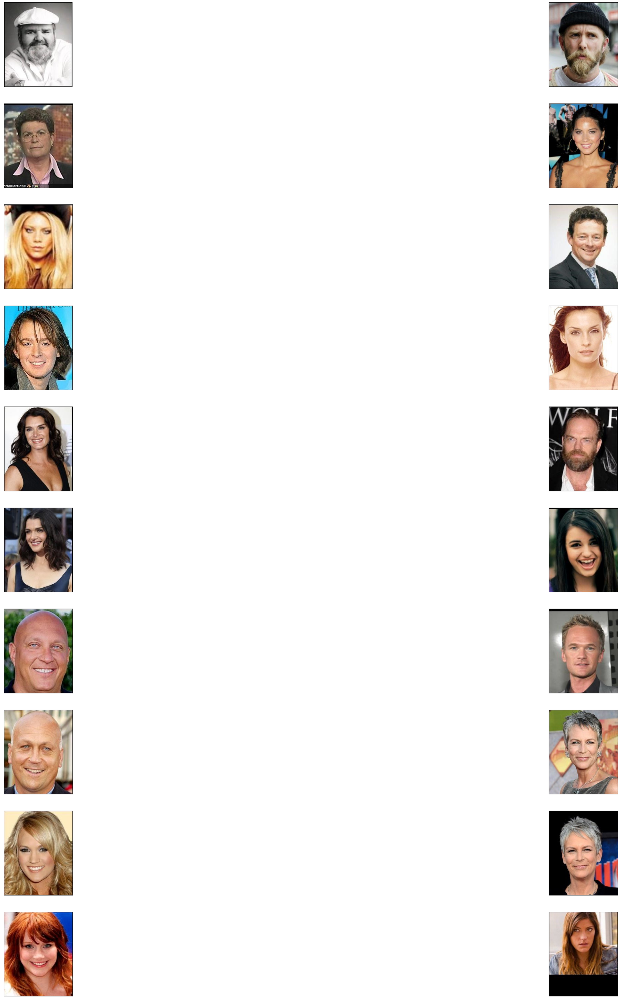

In [81]:
def visualize(b,k):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(50, 50))

    axs = fig.subplots(k, 2)
    for i in range(k):
        img1=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i]])
        img2=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i+1]])
        show(axs[i, 0], cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        show(axs[i, 1], cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        

#Cosine Similarity pairs
visualize(bI,10)

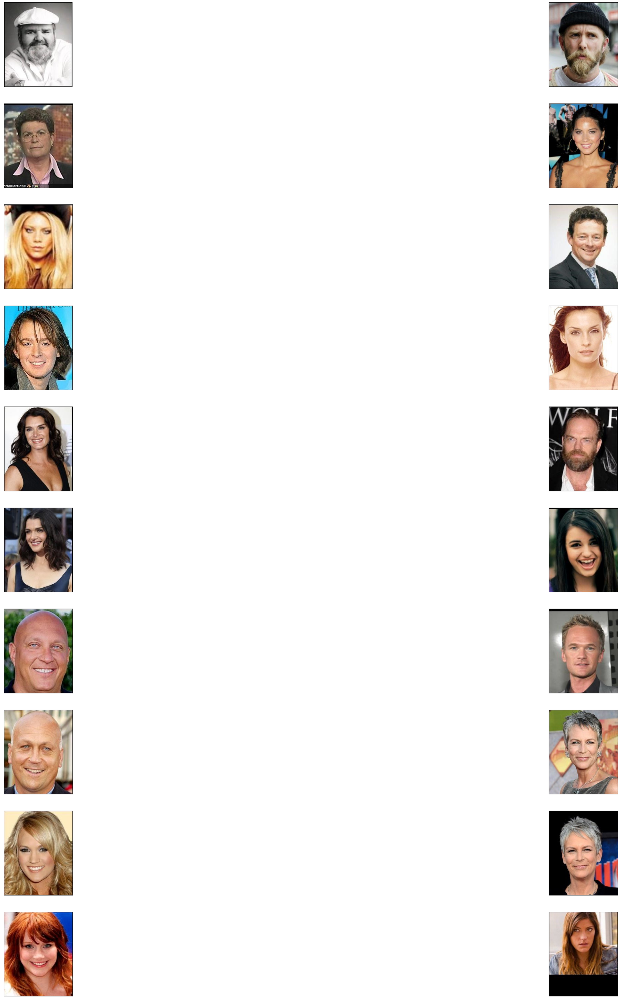

In [82]:
#pairs obtained from the euclidean distance
visualize(dI,10)

In [83]:
l=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]

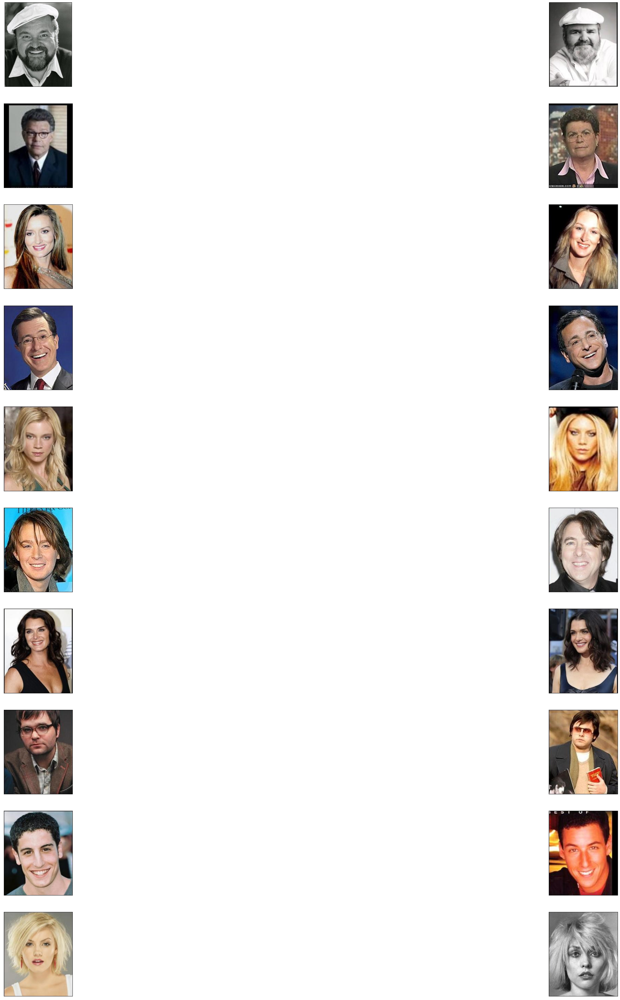

In [84]:
#pairs of the dataset
visualize(l,10)

## The pairs obtained from both measures seem to be unsatisfying and that is due to the simplicity of the OpenFace model.